# First: An intro one for new people, something easy to help them get their feet on the ground. This should be a breeze for anyone who's done any previous coding clubs.

## Choose a neuron, whatever you like as long as it has upstream and downstream partners.

I'm arbitrarily choosing 720575940605214636, which is one of the two default neurons that pop up

In [1]:
selected_id = '720575940631693610' # as a string is better because the ID number can be too large when converted sometimes

## Get its top 3 downstream partners and upstream partners (via fafbseg or natverse)

First let's import necessary packages, which are navis and fafbseg (specifically the flywire module from fafbseg is all we'll need).

In [2]:
import navis
from fafbseg import flywire

Now to fetch all the upstream and downstream partners for the neuron I'm choosing

In [3]:
connectivity = flywire.fetch_connectivity(selected_id)

Using materialization version 757


To get the top 3 up and downstream partners, we have to use some Pandas filtering.
You'll also notice that I'm converting the data I'm filtering to strings. This is to ensure that there are no data type mismatches between the string data type I set for the selected ID and the type of IDs I'm filtering through.

In [4]:
up_stream_partners = connectivity[connectivity.post.astype(str)==selected_id]
down_stream_partners = connectivity[connectivity.pre.astype(str)==selected_id]

# The connectivity table is already sorted by weight (number of synapses), so we just need
# to get the IDs of the top 3 partners in each of the 2 tables we made above.

top_up_partners = up_stream_partners.pre.astype(str).values[:3]
top_down_partners = down_stream_partners.post.astype(str).values[:3]

Now I have the top 3 up and down-stream partners saved into those respective lists. 

In [5]:
print('Top 3 upstream partners of '+str(selected_id)+': '+str(top_up_partners))
print('Top 3 downstream partners of '+str(selected_id)+': '+str(top_down_partners))

Top 3 upstream partners of 720575940631693610: ['720575940629687824' '720575940631842360' '720575940613380914']
Top 3 downstream partners of 720575940631693610: ['720575940621000831' '720575940622838154' '720575940637663662']


## Using natverse/Navis, plot all 7 neurons in either 2D or 3D:

First let's get the meshes for all 7 of the neurons

In [16]:
selected_mesh = flywire.l2_skeleton(selected_id)
upstream_meshes = flywire.l2_skeleton(top_up_partners)
downstream_meshes = flywire.l2_skeleton(top_down_partners)

Fetching L2 skeletons:   0%|          | 0/3 [00:00<?, ?it/s]

Fetching L2 skeletons:   0%|          | 0/3 [00:00<?, ?it/s]

We can plot them all without custom coloring very easily!

In [17]:
navis.plot3d([selected_mesh, upstream_meshes, downstream_meshes])

### Applying custom colors is barely harder, though

#### main one in red

In [18]:
navis.plot3d(selected_mesh, color='red')

#### upstream 3 in blue

In [19]:
navis.plot3d([selected_mesh, upstream_meshes], color=['red']+['blue']*3)

#### downstream 3 in yellow

In [20]:
navis.plot3d([selected_mesh, upstream_meshes, downstream_meshes], color=['red']+['blue']*3+['yellow']*3)

### also plot all of the synapse locations between the main neuron and the other 6 as white dots

First lets get all the synapses between these neurons.

In [21]:
all_syns = flywire.fetch_synapses(selected_id)

Using materialization version 757


Now to limit to the synapses between our selected neuron and the 6 partners we need.

As a brief mention, the __[pd.Series.isin()](https://pandas.pydata.org/docs/reference/api/pandas.Series.isin.html)__ function is VERY useful for finding all the matches of a dataframe column that are in a list.

In [22]:
selected_neurons = [selected_id] + list(top_up_partners) + list(top_down_partners) # Get the list of the 7 neurons we need

# First limit to all synapses where pre-synaptic partner is in the list of 7 neurons
selected_syns = all_syns[all_syns.pre.astype(str).isin(selected_neurons)]
# Next limit those to where the post-synaptic partner is one of the 7
selected_syns = selected_syns[selected_syns.post.astype(str).isin(selected_neurons)]

In [27]:
# To plot, we first have to limit the table to just the 3 columns we need to place in 3D space
syn_locs = selected_syns[['pre_x', 'pre_y', 'pre_z']].values
navis.plot3d(syn_locs, color='white')

In [30]:
navis.plot3d([selected_mesh, upstream_meshes, downstream_meshes, syn_locs], color=['red']+['blue']*3+['yellow']*3+['white']*len(syn_locs))

## Now choose a cell type, and get all the neurons in that cell type from flytable.

I'm randomly selecting ORN_DM5. No real reason why.

In [31]:
cell_type = 'ORN_DM5'

## Fetch all the upstream and downstream partners of all the neurons in that type.

First we have to get all the neurons with this cell type. 

This first requires getting programatic access to Flytable.

In [32]:
# seaserpent (https://github.com/schlegelp/sea-serpent) is a programatic way to access flytable
# (developed by Philipp)
import seaserpent as ss

# You need to pass the URL for the table:
%env SEATABLE_SERVER = https://flytable.mrc-lmb.cam.ac.uk/

# You also need your seatable token - everyone should have their own!
%env SEATABLE_TOKEN = 59481ea08c6a2ff4f3635ea54199520ce1a0f1dd

env: SEATABLE_SERVER=https://flytable.mrc-lmb.cam.ac.uk/
env: SEATABLE_TOKEN=59481ea08c6a2ff4f3635ea54199520ce1a0f1dd


In [33]:
#Now to fetch the actual table from Flytables as a dataframe
table = ss.Table(table='info', base='main').to_frame().reset_index()

In [34]:
type_table = table[table.cell_type == cell_type]
type_ids = type_table.root_id

### What are the top 3 upstream classes and top 3 downstream classes?

First we need to fetch all the partners of all the neurons in the type

In [52]:
all_partners = flywire.fetch_connectivity(type_ids)

# First lets get just the downstream partners - this is all the connections where the upstream partners is one of the neurons in the selected type
down_partners = all_partners[all_partners.pre.astype(str).isin(type_ids.values)].post.values

# Now all the upstream partners
up_partners = all_partners[all_partners.post.astype(str).isin(type_ids.values)].pre.values

Using materialization version 757


Fetching connectivity:   0%|          | 0/2 [00:00<?, ?it/s]

Now find these neurons in the info table on flytable

In [69]:
# let's do downstream partners first
down_annos = table[table.root_id.astype(int).isin(down_partners)]
down_annos.value_counts('cell_type')

cell_type
ORN_DM5      42
lLN2X12      10
lLN2X03       6
il3LN6        6
lLN2X02       4
lLN2X11       4
lLN2X10       4
lLN2X04       4
lLN2X05       2
CSD           2
LN60a         2
M_vPNml50     2
LN60b         2
v2LN30        2
ORN_DM6       1
ORN_DM2       1
lLN2X09       1
M_l2PNl21     1
Name: count, dtype: int64

In [70]:
# and now upstream partners
up_annos = table[table.root_id.astype(int).isin(up_partners)]
up_annos.value_counts('cell_type')

cell_type
ORN_DM5    41
lLN2X12     7
il3LN6      6
lLN2X03     4
lLN1_bc     3
lLN2X05     3
lLN2X10     3
lLN2X11     3
lLN2X02     2
lLN2X04     2
ORN_DM4     1
ORN_DM6     1
lLN2X09     1
v2LN30      1
Name: count, dtype: int64

### Do any of the upstream or downstream classes also directly interact?

To do this, we must fetch all the neurons in any of the top classes.

Let's first put all the partner cell types in one list.

In [83]:
all_partner_types = down_annos.cell_type.values.tolist() + up_annos.cell_type.values.tolist()

#now let's make it a unique list (which is easily accomplished by turning a list into a set and then back in python)
all_partner_types = list(set(all_partner_types) - set([cell_type]))[:-1]

Now we can grab all the neurons with these cell types from the info table and pull their root IDs into a list

In [85]:
partner_table = table[table.cell_type.isin(all_partner_types)]
partner_ids = partner_table.root_id.values

Now we can check adjacency

In [99]:
partner_adj = flywire.fetch_adjacency(list(set(partner_ids)), filtered=True)

Using materialization version 757


My personal favorite way to show this off is via seaborn, as a heatmap.

<Axes: xlabel='target', ylabel='source'>

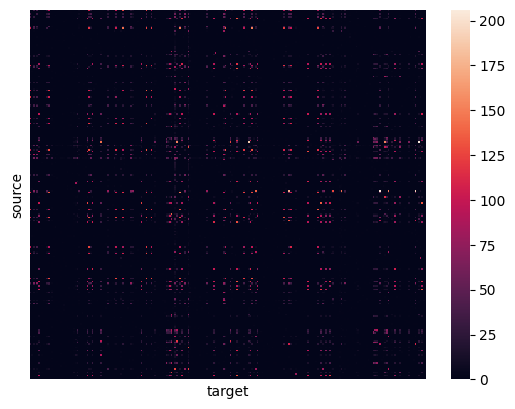

In [100]:
import seaborn as sns
sns.heatmap(partner_adj, xticklabels=[], yticklabels=[])

I'm bored, so I'm going to group these by cell types.

In [107]:
import pandas as pd
from tqdm import tqdm

typed_adj = pd.DataFrame(index = all_partner_types, columns=all_partner_types)
for type_pre in tqdm(all_partner_types, position=0):
    for type_post in all_partner_types:
        pre_ids = table[table.cell_type == type_pre].root_id.values
        post_ids = table[table.cell_type == type_post].root_id.values
        typed_adj.loc[type_pre, type_post] = flywire.fetch_adjacency(sources= pre_ids,
                                                                     targets= post_ids, 
                                                                     filtered=True).values.sum()

  0%|                                                                                            | 0/19 [00:00<?, ?it/s]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


  5%|████▍                                                                               | 1/19 [00:14<04:29, 14.97s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 11%|████████▊                                                                           | 2/19 [00:30<04:15, 15.02s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 16%|█████████████▎                                                                      | 3/19 [00:44<03:56, 14.79s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 21%|█████████████████▋                                                                  | 4/19 [00:59<03:40, 14.73s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 26%|██████████████████████                                                              | 5/19 [01:13<03:23, 14.50s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 32%|██████████████████████████▌                                                         | 6/19 [01:28<03:09, 14.59s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 37%|██████████████████████████████▉                                                     | 7/19 [01:42<02:53, 14.50s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 42%|███████████████████████████████████▎                                                | 8/19 [01:56<02:39, 14.49s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 47%|███████████████████████████████████████▊                                            | 9/19 [02:11<02:23, 14.40s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 53%|███████████████████████████████████████████▋                                       | 10/19 [02:25<02:09, 14.42s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 58%|████████████████████████████████████████████████                                   | 11/19 [02:39<01:55, 14.43s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 63%|████████████████████████████████████████████████████▍                              | 12/19 [02:54<01:41, 14.52s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 68%|████████████████████████████████████████████████████████▊                          | 13/19 [03:10<01:29, 14.84s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 74%|█████████████████████████████████████████████████████████████▏                     | 14/19 [03:24<01:13, 14.68s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 79%|█████████████████████████████████████████████████████████████████▌                 | 15/19 [03:48<01:09, 17.47s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 84%|█████████████████████████████████████████████████████████████████████▉             | 16/19 [04:03<00:49, 16.63s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 89%|██████████████████████████████████████████████████████████████████████████▎        | 17/19 [04:17<00:31, 15.87s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


 95%|██████████████████████████████████████████████████████████████████████████████▋    | 18/19 [04:32<00:15, 15.58s/it]

Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757
Using materialization version 757


100%|███████████████████████████████████████████████████████████████████████████████████| 19/19 [04:46<00:00, 15.10s/it]


In [126]:
import numpy as np 
np.fill_diagonal(typed_adj.values, np.nan)
typed_adj = typed_adj.rename_axis(index='source', columns="target")

<Axes: xlabel='target', ylabel='source'>

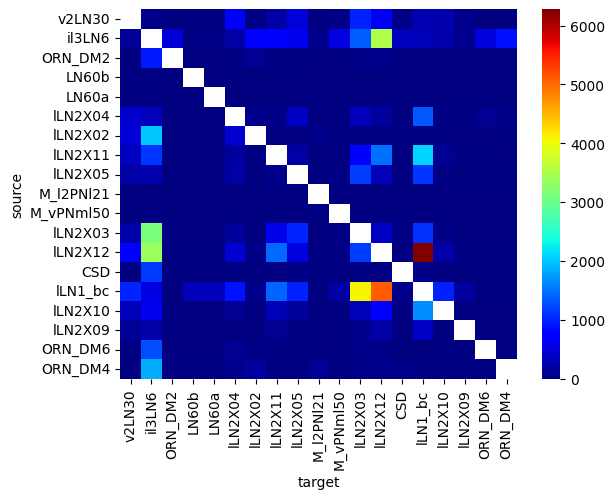

In [128]:
typed_adj  = typed_adj.astype(float)
sns.heatmap(typed_adj, cmap='jet')

# Now a network based one if you want a challenge and to learn to do some cool stuff

First imports

In [41]:
import numpy as np
import pandas as pd

import igraph as ig
import networkx as nx
import karateclub as kc

import seaborn as sns
import matplotlib.pyplot as plt

import umap.umap_ as umap

/home/griff/.local/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/griff/.local/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/griff/.local/lib/python3.10/site-packages/umap/distances.py:1086: NumbaDeprecationWarning: The '

Now let's get info table so we can assign types/classes

In [5]:
# seaserpent (https://github.com/schlegelp/sea-serpent) is a programatic way to access flytable
# (developed by Philipp)
import seaserpent as ss

# You need to pass the URL for the table:
%env SEATABLE_SERVER = https://flytable.mrc-lmb.cam.ac.uk/

# You also need your seatable token - everyone should have their own!
%env SEATABLE_TOKEN = 59481ea08c6a2ff4f3635ea54199520ce1a0f1dd

env: SEATABLE_SERVER=https://flytable.mrc-lmb.cam.ac.uk/
env: SEATABLE_TOKEN=59481ea08c6a2ff4f3635ea54199520ce1a0f1dd


In [6]:
#Now to fetch the actual table from Flytables as a dataframe
table = ss.Table(table='info', base='main').to_frame().reset_index()
table.set_index('root_630', inplace=True)
table = table[table.index.notnull()]
table.index = table.index.astype(int)
table = table[~table.index.duplicated(keep='first')]

Now we fetch the synapses and restrict to a selected neuropil

In [7]:
all_syns = pd.read_feather('syn_proof_analysis_filtered_630.feather')

In [8]:
npil_syns = all_syns[all_syns.neuropil=='PB']

Now turn that filtered synapse table into a graph

In [9]:
tuples = [tuple(x) for x in npil_syns[npil_syns.columns[[0,1,3]]].values]
graph = ig.Graph.TupleList(tuples, directed = True, edge_attrs = ['weight'])

Get the diameter and the neurons in that diameter

In [10]:
diameter_path = graph.get_diameter()

In [11]:
diameter_names = np.asarray(graph.vs['name'])[diameter_path]

In [12]:
selected = table[table.root_id.astype(int).isin(diameter_names)]

In [92]:
selected

,row_id,supervoxel_id,root_id,pos_x,pos_y,pos_z,soma_x,soma_y,soma_z,nucleus_id,...,root_duplicated,proofread,root_last_modified,last_user,LM_match,LM_match_source,nerve,cb_type,release_630,morphology_group
root_630,,,,,,,,,,,,,,,,,,,,,
720575940626051514,QOQXU85mRgKvYEQsBpqJBQ,79662022949896897,720575940626051514,131127.0,75297.0,2771.0,125744.0,90088.0,2898.0,4704226.0,...,False,True,2022-10-25 01:38:00,scripts,<NA>,<NA>,<NA>,<NA>,True,MD0__prim_4
720575940615359538,dFN9ROXyQ4GanQpuTXIi-w,77549311625924064,720575940615359538,100629.0,50454.0,5080.0,97792.0,49328.0,5327.0,2091640.0,...,False,True,2022-07-08 05:21:00,scripts,<NA>,<NA>,<NA>,<NA>,True,<NA>
720575940629432124,LM1J1hPQQD-qPkXmPR8L0Q,82615723431659102,720575940629432124,174424.0,48664.0,2096.0,174424.0,48664.0,2096.0,7369397.0,...,False,True,2022-06-20 15:25:00,scripts,<NA>,<NA>,<NA>,<NA>,True,<NA>
720575940626043966,CifNbpyESlCdqf9Q_iC80Q,80644849107417769,720575940626043966,146286.0,40420.0,4250.0,147160.0,41192.0,4903.0,5666545.0,...,False,True,2022-09-26 17:57:00,scripts,<NA>,<NA>,<NA>,<NA>,True,DM4_dorsal_2
720575940624125477,H70o-XW2Q_KvNPHedHyKNA,78534061727555227,720575940624125477,115447.0,44632.0,5091.0,111280.0,45840.0,5449.0,3054080.0,...,False,True,2021-09-17 06:50:00,scripts,<NA>,<NA>,<NA>,<NA>,True,PSp3_1
720575940619379182,S_ZsZ9k4QY-kfduXw7K64Q,77550548509357881,720575940619379182,100432.0,68304.0,4533.0,100432.0,68304.0,4533.0,2574056.0,...,False,True,2022-01-18 20:03:00,scripts,<NA>,<NA>,<NA>,<NA>,True,<NA>
720575940616102998,eMoXZG95RNaO844w_rCuEQ,78957305051696955,720575940616102998,120760.0,59952.0,5442.0,120760.0,59952.0,5442.0,3729044.0,...,False,True,2022-06-10 04:06:00,scripts,<NA>,<NA>,<NA>,<NA>,True,DM6_posterior_2
720575940621972957,HQ3Kkwj6RpeY8YqTsOHx8g,78534130447034044,720575940621972957,115403.0,44684.0,5091.0,109624.0,45680.0,5388.0,3053269.0,...,False,True,2022-06-29 02:36:00,scripts,<NA>,<NA>,<NA>,<NA>,True,PSp3_1
720575940604756000,Q_CFq8VhS6uHlXs649p54Q,80926598962552563,720575940604756000,149472.0,44513.0,4610.0,149216.0,42848.0,4816.0,6369497.0,...,False,True,2022-04-14 02:13:00,scripts,<NA>,<NA>,<NA>,<NA>,True,<NA>


Now for closeness!

In [13]:
all_cc = graph.closeness()

In [14]:
df = pd.DataFrame(index=graph.vs['name'], columns=['class', 'close_c'])

In [15]:
in_both = [x for x in graph.vs['name'] if x in table.index.values ]

In [16]:
df = df.loc[in_both]

In [17]:
df['class'] = table.loc[df.index, 'cell_class'].values
df.loc[graph.vs['name'], 'close_c'] = all_cc

In [18]:
df['class'] = df['class'].astype(str)

<Axes: xlabel='class', ylabel='close_c'>

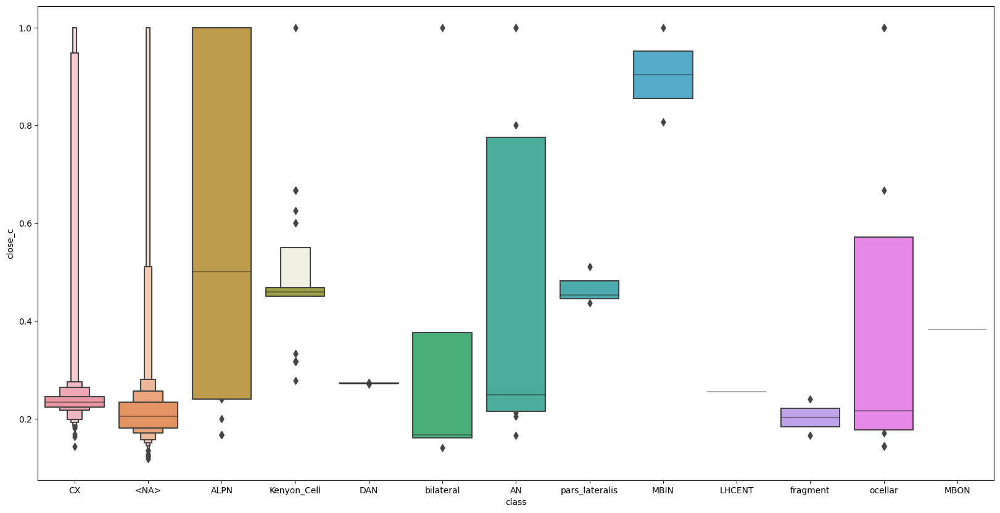

In [19]:
fig, ax = plt.subplots(figsize=(20,10))
sns.boxenplot(data=df, x='class', y='close_c')

Time to cluster

In [28]:
clus = graph.community_leading_eigenvector(weights = 'weight')

/home/griff/.local/lib/python3.10/site-packages/igraph/community.py:132: RuntimeWarning: This method was developed for undirected graphs at src/community/leading_eigenvector.c:391
  membership, _, q = GraphBase.community_leading_eigenvector(graph, clusters, **kwds)


In [29]:
len(clus)

84

And I'm bored so I'm going to embed the graph

In [97]:
model = kc.Walklets()

In [98]:
nxg = graph.to_networkx()
model.fit(nxg)

In [99]:
embs = model.get_embedding()

In [100]:
fit = umap.UMAP()
u = fit.fit_transform(embs)

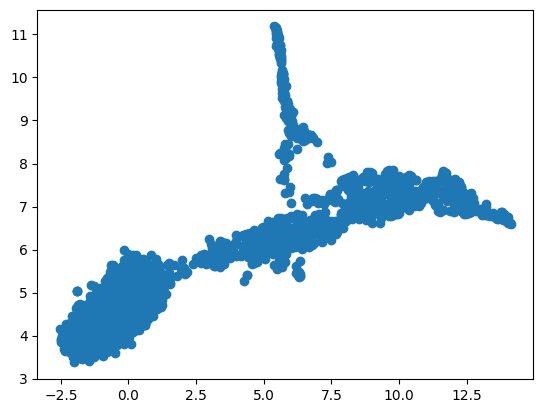

In [101]:
plt.scatter(u.T[0], u.T[1])

In [102]:
names = [x[1]['name'] for x in nxg.nodes(data=True)]
df.loc[names, 'cl_x'] = u.T[0]
df.loc[names, 'cl_y'] = u.T[1]

<Axes: xlabel='cl_x', ylabel='cl_y'>

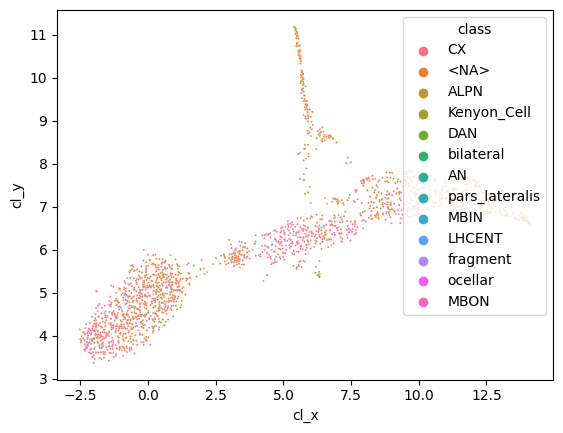

In [105]:
sns.scatterplot(df, x='cl_x', y='cl_y', hue='class', s=2)

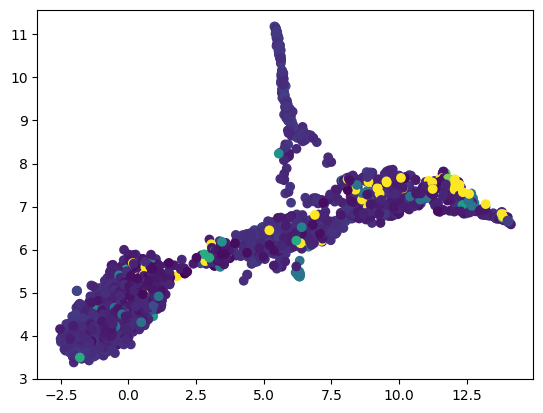

In [104]:
plt.scatter(x=df.cl_x, y=df.cl_y, c=df.close_c)